In [36]:
# TODO, maybe draw and analyse anchor positive assignemtn among different pyrimid level
import sys
sys.path.insert(0, "/home/lab530/KenYu/ml_toolkit/kitti")
from util_kitti import kitti_label_file_parser, kitti_calib_file_parser, get_corner_2D, set_bev_background, KITTI_Object, P2_dict
from util_kitti import AVG_HEIGT, AVG_WIDTH, AVG_LENTH, init_zy_plt, init_xz_plt, load_tf_image_fpn, init_img_plt_without_bev
from util_kitti import ANCHOR_Y_3D_MEAN, ANCHOR_Y_3D_STD, init_img_plt, load_tf_image, type_dict, shape_dict
from util_kitti import draw_corner_2D, draw_birdeyes, calc_iou, draw_2Dbox, KITTI_Object, gac_original_anchor_parser

import pickle
import torch
import numpy as np

with open('/home/lab530/KenYu/visualDet3D/covered_missed_gt/anchor_prior_calculation_result.pkl', 'rb') as f:
    anchor_prior_calculation_result = pickle.load(f)

cover_bbox2d_gts  = anchor_prior_calculation_result['cover_bbox2d_gts'] 
misss_bbox2d_gts  = anchor_prior_calculation_result['misss_bbox2d_gts']
anchor_all_2dbbox = anchor_prior_calculation_result['anchor_all_bbox2d']
anchor_2dbbox     = anchor_prior_calculation_result['anchor_bbox2d']
anchor_mean       = anchor_prior_calculation_result['anchor_mean']
anchor_std        = anchor_prior_calculation_result['anchor_std']

if len(anchor_2dbbox.shape) == 3 or len(anchor_mean.shape) == 3 or len(anchor_std.shape) == 3:
    anchor_2dbbox = anchor_2dbbox.reshape((-1, 4))
    anchor_mean   = anchor_mean.reshape((-1, 6))
    anchor_std    = anchor_std.reshape((-1, 6))

print(f"cover_bbox2d_gts = {cover_bbox2d_gts.shape}")
print(f"misss_bbox2d_gts = {misss_bbox2d_gts.shape}")
print(f"anchor_all_2dbbox = {anchor_all_2dbbox.shape}")
print(f"anchor_2dbbox = {anchor_2dbbox.shape}")
print(f"anchor_mean = {anchor_mean.shape}")
print(f"anchor_std = {anchor_std.shape}")
print(f"Total Number of groundtrue = {cover_bbox2d_gts.shape[0] + misss_bbox2d_gts.shape[0]}")
print(f"Best possible recall = {cover_bbox2d_gts.shape[0]/(cover_bbox2d_gts.shape[0] + misss_bbox2d_gts.shape[0])}")




cover_bbox2d_gts = (13395, 4)
misss_bbox2d_gts = (962, 4)
anchor_all_2dbbox = (46080, 4)
anchor_2dbbox = (32, 4)
anchor_mean = (32, 6)
anchor_std = (32, 6)
Total Number of groundtrue = 14357
Best possible recall = 0.9329943581528174


# K-means cluster


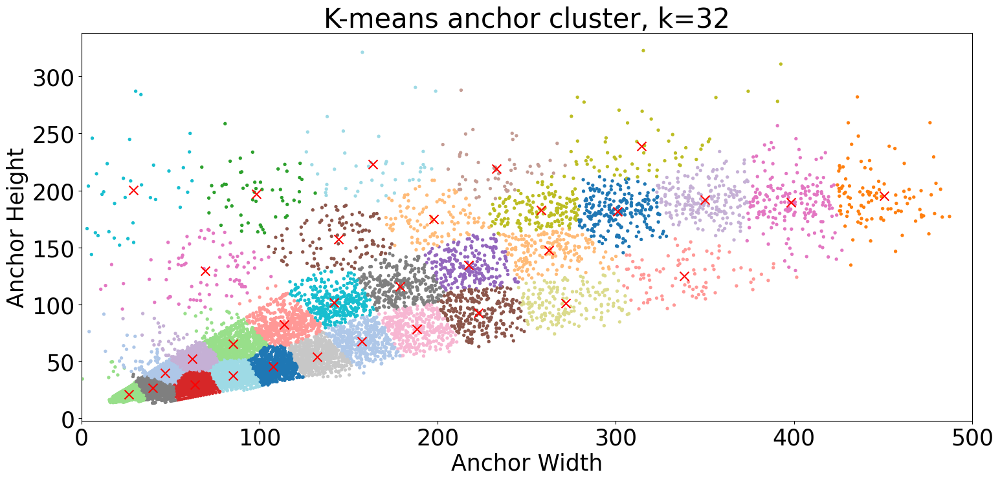

In [37]:
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
import os 

NUM_GROUP = 32

all_gts = np.concatenate((cover_bbox2d_gts, misss_bbox2d_gts), axis=0)
wh_data = np.concatenate( [ (all_gts[:, 2] - all_gts[:, 0])[:, np.newaxis], 
                            (all_gts[:, 3] - all_gts[:, 1])[:, np.newaxis]], axis=1 )

# 用 KMeans 在資料中找出 N 個分組
kmeans = KMeans(n_clusters=NUM_GROUP)
kmeans.fit(wh_data)
# print(kmeans.cluster_centers_[np.argsort(kmeans.cluster_centers_[:, 0])])

anchor_kmeans = np.concatenate( [ (-kmeans.cluster_centers_[:, 0]/2)[:, np.newaxis],
                                  (-kmeans.cluster_centers_[:, 1]/2)[:, np.newaxis],
                                  (+kmeans.cluster_centers_[:, 0]/2)[:, np.newaxis],
                                  (+kmeans.cluster_centers_[:, 1]/2)[:, np.newaxis]], axis=1 )

# get the indices that would sort the array by the first column
# 預測新的目標值 label
new_dy = kmeans.predict(wh_data)
plt.rcParams['font.size'] = 25
plt.figure(figsize=(16, 8))
plt.xlabel('Anchor Width')
plt.ylabel('Anchor Height')
plt.xlim([0, 500])
plt.title(f'K-means anchor cluster, k={NUM_GROUP}')
plt.scatter(wh_data.T[0], wh_data.T[1], c=new_dy, cmap=plt.cm.tab20, s=8)

plt.scatter(kmeans.cluster_centers_.T[0], kmeans.cluster_centers_.T[1], color=(1,0,0), s=100, marker='x')
plt.tight_layout()
plt.show()


# Output Kmeans's anchor
# np.save("/home/lab530/KenYu/visualDet3D/kmeans_anchor_32/2dbbox.npy", anchor_kmeans)


# Plot point on image

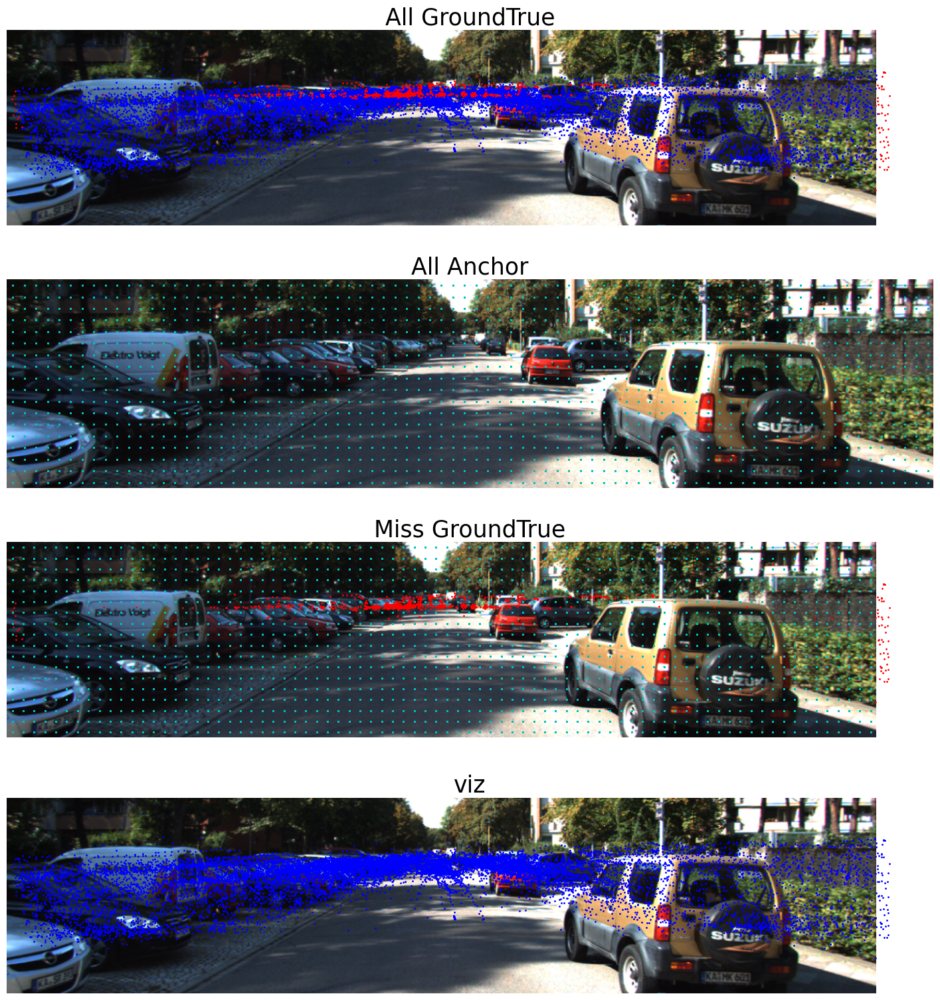

In [75]:
import random
# Load images
imgs_tf = []
SHOW_IMAGE = ['000169']

for img_id in SHOW_IMAGE:
    img = load_tf_image(f"/home/lab530/KenYu/kitti/training/image_2/{img_id}.png")
    imgs_tf.append(img)

MARKER_SIZE = 2
axs = init_img_plt_without_bev([imgs_tf[0], imgs_tf[0], imgs_tf[0], imgs_tf[0]], 
                               ["All GroundTrue", "All Anchor", "Miss GroundTrue", "viz"] )

# Draw missed bounding box
# for i in range(misss_bbox2d_gts.shape[0]):
#     draw_2Dbox(axs[0], (misss_bbox2d_gts[i, 0], 
#                         misss_bbox2d_gts[i, 1], 
#                         misss_bbox2d_gts[i, 2], 
#                         misss_bbox2d_gts[i, 3]), color = (1,0,0))

# Draw Assignemnt result
axs[0].plot((cover_bbox2d_gts[:, 0] + cover_bbox2d_gts[:, 2]) /2, 
            (cover_bbox2d_gts[:, 1] + cover_bbox2d_gts[:, 3]) /2, '.b',markersize=MARKER_SIZE)
axs[0].plot((misss_bbox2d_gts[:, 0] + misss_bbox2d_gts[:, 2]) /2, 
            (misss_bbox2d_gts[:, 1] + misss_bbox2d_gts[:, 3]) /2, '.r',markersize=MARKER_SIZE)
axs[1].plot((anchor_all_2dbbox[:, 0] + anchor_all_2dbbox[:, 2]) /2, 
            (anchor_all_2dbbox[:, 1] + anchor_all_2dbbox[:, 3]) /2, '.c',markersize=MARKER_SIZE)

axs[2].plot((anchor_all_2dbbox[:, 0] + anchor_all_2dbbox[:, 2]) /2, 
            (anchor_all_2dbbox[:, 1] + anchor_all_2dbbox[:, 3]) /2, '.c',markersize=MARKER_SIZE)

axs[2].plot((misss_bbox2d_gts[:, 0] + misss_bbox2d_gts[:, 2]) /2, 
            (misss_bbox2d_gts[:, 1] + misss_bbox2d_gts[:, 3]) /2, '.r',markersize=MARKER_SIZE)

# Draw image for vizualization
bin_gts = []
bin_dig_s8 = np.digitize((all_gts[:, 1] + all_gts[:, 3])/2, np.arange(4, 288, 8)) - 1 # (14357,)
for yi in range(36): bin_gts.append(all_gts[bin_dig_s8 == yi])
for yi in range(36):
    color = plt.cm.tab20( random.randint(0, 10) )
    axs[3].plot((bin_gts[yi][:, 0] + bin_gts[yi][:, 2]) /2, 
                (bin_gts[yi][:, 1] + bin_gts[yi][:, 3]) /2, '.b',markersize=MARKER_SIZE) #, color=color)


# Plot 2D and 3D anchor

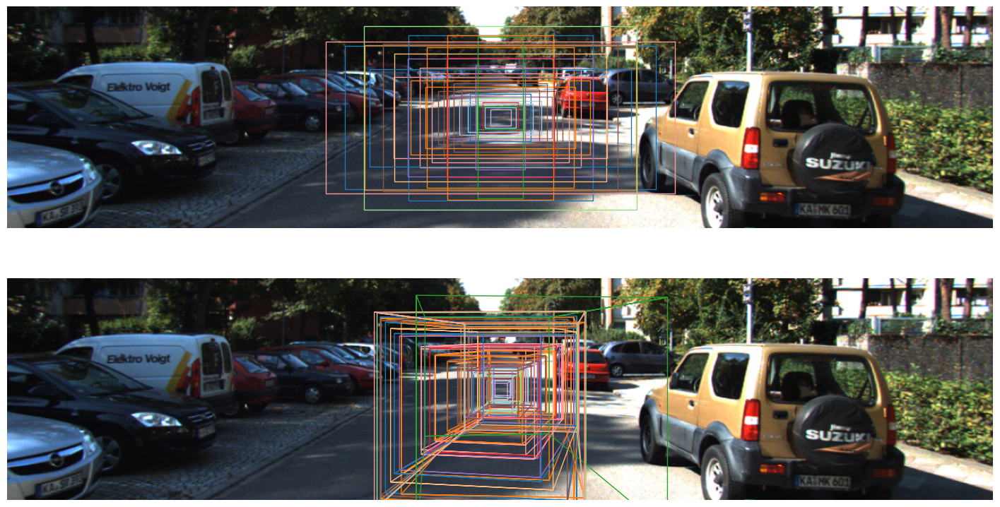

In [39]:
import random
from math import atan2, pi

# Load images
img = load_tf_image("/home/lab530/KenYu/kitti/training/image_2/000169.png")

# Load P2
P2 = kitti_calib_file_parser("/home/lab530/KenYu/kitti/training/calib/000169.txt", new_shape_tf = (288, 1280), crop_tf = 100)

MARKER_SIZE = 2
N_ANCHOR_SHOW = 4 # How many anchor to show on a single image frame
NUM_ANCHOR_GROUP = anchor_2dbbox.shape[0]//N_ANCHOR_SHOW
axs = init_img_plt_without_bev([img]*2)

for i in range(anchor_2dbbox.shape[0]):
    color = plt.cm.tab20( random.randint(0, 10) )
    
    cx, cy = (640, 144)
    cz =  anchor_mean[i, 0] # [z, sin, cos, w, h ,l]
    # print(f"anchor_mean = {anchor_mean.shape}")

    loc_3d = np.linalg.inv(P2[:, :3]) @ np.array([[cx*cz], [cy*cz], [cz]])
    loc_3d[1, 0] += anchor_mean[i, 4] / 2.0

    # Get observation angle: alpha
    alpha = atan2(anchor_mean[i, 1], anchor_mean[i, 2]) / 2.0
    rot_y = alpha - atan2(loc_3d[2, 0], loc_3d[0, 0]) + pi/2

    # alpha in [-pi, pi]
    if   rot_y >  pi: rot_y -= 2*pi
    elif rot_y < -pi: rot_y += 2*pi
    
    str_line = f"Car NA NA {alpha} NA NA NA NA {anchor_mean[i, 4]} {anchor_mean[i, 3]} {anchor_mean[i, 5]} {loc_3d[0, 0]} {loc_3d[1, 0]} {loc_3d[2, 0]} {rot_y} NA"

    a = KITTI_Object(str_line, P2)
    
    draw_2Dbox(axs[0], (anchor_2dbbox[i, 0] + 640,
                        anchor_2dbbox[i, 1] + 144, 
                        anchor_2dbbox[i, 2] + 640, 
                        anchor_2dbbox[i, 3] + 144), color = color)
    draw_corner_2D(axs[1], a.corner_2D, color = color, is_draw_front=False)
    

# Depth-Aware sampling (DAS) - With row bin

In [40]:
# import sys
# import copy 
# sys.path.insert(0, "/home/lab530/KenYu/visualDet3D/")

# from visualDet3D.networks.utils.utils import calc_iou

# all_gts = np.concatenate((cover_bbox2d_gts, misss_bbox2d_gts), axis=0)

# bin_gts = [[] for _ in range(36)]

# gts_cx = ( all_gts[:, 0] + all_gts[:, 2] ) / 2
# gts_cy = ( all_gts[:, 1] + all_gts[:, 3] ) / 2

# print(f"gts_cx = {gts_cx.shape}")
# print(f"gts_cy = {gts_cy.shape}")

# bin_dig = np.digitize(gts_cy,  np.arange(4, 296, 8)) - 1 # (14357,)
# unique_values, counts = np.unique(bin_dig, return_counts=True)
# # for value, count in zip(unique_values, counts):
# #     print(f"{value} occurs {count} times")

# for i in range(36):
#     bin_gts[i] = all_gts[bin_dig == i]

# strides = [8, 16, 32, 64, 128]
# for yi in range(36):    
#     if bin_gts[yi].shape[0] == 0: continue

#     bpr = []
#     for x_stride in strides:
#         anchors_y = 4 + yi*8
        
#         # Get rows_anchor
#         rows_anchor = []
#         for xi in range(160):
            
#             anchors_x = x_stride //2 + xi*x_stride 
#             row_anchor = copy.deepcopy(anchor_2dbbox)
#             row_anchor[:, 0] += anchors_x
#             row_anchor[:, 1] += anchors_y
#             row_anchor[:, 2] += anchors_x
#             row_anchor[:, 3] += anchors_y
#             rows_anchor.append(row_anchor)
#         rows_anchor = np.concatenate(rows_anchor, axis=0)
        
#         # Get IoU
#         IoUs = calc_iou(torch.tensor(rows_anchor), torch.tensor(bin_gts[yi])) #[N, K], [46080, num_gt]
#         # IoUs = calc_iou(torch.tensor(rows_anchor), torch.tensor(all_gts)) #[N, K], [46080, num_gt]
        
        
#         IoU_max, IoU_argmax = torch.max(IoUs, dim=0) # IoU_max # [num_gt]
#         num_covered_gt = torch.sum(IoU_max > 0.5).item()
        
#         bpr.append( round(100*num_covered_gt/bin_gts[yi].shape[0], 4) )
#         # bpr.append( round(100*num_covered_gt/all_gts.shape[0], 4) )
        
#     # Get best stride for this row
#     best_stride = strides[-1]
#     for i in range(1, len(strides)):
#         if abs(bpr[i] - bpr[i-1]) > 0.0: # Stop! i-1 was the best 
#             best_stride = strides[i-1]
#             break
    
#     print(f"row_yi = {yi}, num_gt = {bin_gts[yi].shape[0]},  bpr = {bpr}, best_stride = {best_stride}")


# print(f"cover_bbox2d_gts = {all_gts.shape}")
# # print(f"misss_bbox2d_gts = {misss_bbox2d_gts.shape}")

gts_cx = (14357,)
gts_cy = (14357,)
row_yi = 6, num_gt = 3,  bpr = [100.0, 100.0, 33.3333, 66.6667, 0.0], best_stride = 16
row_yi = 7, num_gt = 56,  bpr = [91.0714, 89.2857, 75.0, 51.7857, 32.1429], best_stride = 8
row_yi = 8, num_gt = 122,  bpr = [93.4426, 90.9836, 85.2459, 66.3934, 38.5246], best_stride = 8
row_yi = 9, num_gt = 380,  bpr = [74.2105, 65.7895, 55.7895, 35.0, 17.6316], best_stride = 8
row_yi = 10, num_gt = 1576,  bpr = [78.6168, 67.9569, 46.4467, 27.5381, 16.7513], best_stride = 8
row_yi = 11, num_gt = 3035,  bpr = [96.6063, 92.3888, 71.6969, 39.0115, 24.2175], best_stride = 8
row_yi = 12, num_gt = 2619,  bpr = [99.6564, 98.9691, 92.4017, 60.4429, 33.5242], best_stride = 8
row_yi = 13, num_gt = 1825,  bpr = [99.726, 99.6712, 97.9178, 83.0685, 39.8356], best_stride = 8
row_yi = 14, num_gt = 1121,  bpr = [99.6432, 99.6432, 99.3756, 93.5772, 61.0169], best_stride = 16
row_yi = 15, num_gt = 692,  bpr = [99.5665, 99.5665, 99.422, 97.2543, 72.1098], best_stride = 16
row_yi = 

# DAS 


gts_cx = (14357,)
gts_cy = (14357,)
row_yi = 7, num_gt = 56,  bpr = 91.0714
row_yi = 8, num_gt = 122,  bpr = 93.4426
row_yi = 9, num_gt = 380,  bpr = 74.2105
row_yi = 10, num_gt = 1576,  bpr = 78.6168
row_yi = 11, num_gt = 3035,  bpr = 96.6063
row_yi = 12, num_gt = 2619,  bpr = 99.6564
row_yi = 13, num_gt = 1825,  bpr = 99.726
row_yi = 14, num_gt = 1121,  bpr = 99.6432
row_yi = 15, num_gt = 692,  bpr = 99.5665
row_yi = 16, num_gt = 539,  bpr = 99.6289
row_yi = 17, num_gt = 407,  bpr = 98.2801
row_yi = 18, num_gt = 307,  bpr = 99.6743
row_yi = 19, num_gt = 257,  bpr = 99.2218
row_yi = 20, num_gt = 210,  bpr = 98.5714
row_yi = 21, num_gt = 274,  bpr = 99.2701
row_yi = 22, num_gt = 282,  bpr = 98.9362
row_yi = 23, num_gt = 356,  bpr = 99.1573
row_yi = 24, num_gt = 218,  bpr = 99.0826
row_yi = 25, num_gt = 61,  bpr = 96.7213
row_yi = 26, num_gt = 12,  bpr = 100.0
stride = 8
(stride, row_id) = (8, 7)
(stride, row_id) = (8, 8)
(stride, row_id) = (8, 9)
(stride, row_id) = (8, 10)
(stride, row

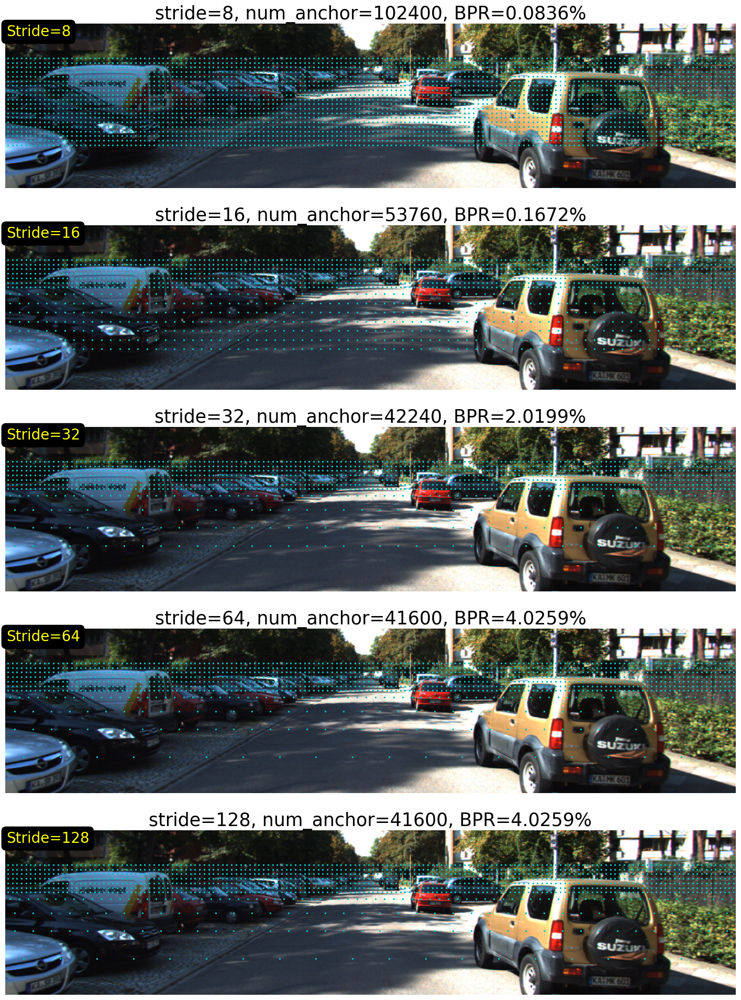

In [78]:
import sys
import copy 
from pprint import pprint
sys.path.insert(0, "/home/lab530/KenYu/visualDet3D/")

from visualDet3D.networks.utils.utils import calc_iou

# Load images
imgs_tf = []
SHOW_IMAGE = ['000169']

for img_id in SHOW_IMAGE:
    img = load_tf_image(f"/home/lab530/KenYu/kitti/training/image_2/{img_id}.png")
    imgs_tf.append(img)

MARKER_SIZE = 2
MERGE_THRES = 10 # How many gts you willing to ignore when merging

strides = [8, 16 ,32, 64, 128]
axs = init_img_plt_without_bev([imgs_tf[0], imgs_tf[0], imgs_tf[0], imgs_tf[0], imgs_tf[0]])

all_gts = np.concatenate((cover_bbox2d_gts, misss_bbox2d_gts), axis=0)

bin_gts = {}
bin_gts[8]  = [[] for _ in range(36)]
bin_gts[16] = [[] for _ in range(18)]
bin_gts[32] = [[] for _ in range(9 )]

gts_cx = ( all_gts[:, 0] + all_gts[:, 2] ) / 2
gts_cy = ( all_gts[:, 1] + all_gts[:, 3] ) / 2

print(f"gts_cx = {gts_cx.shape}")
print(f"gts_cy = {gts_cy.shape}")

bin_dig_s8  = np.digitize(gts_cy, np.arange(4, 288, 8)) - 1 # (14357,)
for i in range(36): bin_gts[8][i]  = all_gts[bin_dig_s8 == i]

for i in range(18):
    bin_gts[16][i] = np.concatenate([bin_gts[8][2*i], bin_gts[8][2*i+1]], axis=0)

for i in range(9 ):
    bin_gts[32][i] = np.concatenate([bin_gts[16][2*i], bin_gts[16][2*i+1]], axis=0)

def generate_row_anchor(stride, yi):
    # Get rows_anchor
    rows_anchor = []
    for xi in range(1280//stride):
        anchors_x = stride//2 + xi*stride
        anchors_y = stride//2 + yi*stride
        row_anchor = copy.deepcopy(anchor_2dbbox)
        row_anchor[:, 0] += anchors_x
        row_anchor[:, 1] += anchors_y
        row_anchor[:, 2] += anchors_x
        row_anchor[:, 3] += anchors_y
        rows_anchor.append(row_anchor)
    return np.concatenate(rows_anchor, axis=0)

metadata_ank = [] # [(stride, row_index, BPR, num_covered_gt, num_missed_gt)]
for i_stride, stride in enumerate(strides):
    
    # The first stride need to build up the metadata_ank
    if stride == 8:
        for yi in range(288//stride):
            # Ignore row if there's too few groundtrue in the row
            if bin_gts[stride][yi].shape[0] < 5: continue
            
            # Get rows_anchor
            rows_anchor = generate_row_anchor(stride, yi)
            
            # Get IoU
            IoUs = calc_iou(torch.tensor(rows_anchor), torch.tensor(bin_gts[stride][yi])) #[N, K], [46080, num_gt]
            IoU_max, IoU_argmax = torch.max(IoUs, dim=0) # IoU_max # [num_gt]
            num_covered_gt = torch.sum(IoU_max > 0.5).item()
            
            # metadata_ank = [(stride, row_index, BPR, num_covered_gt, num_missed_gt), ...]
            metadata_ank.append((stride, 
                                 yi, 
                                 round(100*num_covered_gt/bin_gts[stride][yi].shape[0], 4),
                                 num_covered_gt,
                                 bin_gts[stride][yi].shape[0]-num_covered_gt,
                                 rows_anchor))
            
            print(f"row_yi = {yi}, num_gt = {bin_gts[stride][yi].shape[0]},  bpr = {metadata_ank[-1][2]}")
    else:
        metadata_ank_upper_level = []
        # Find possible merge
        row_ank_i = 0
        while row_ank_i < len(metadata_ank):
            
            row_anchor1 = metadata_ank[row_ank_i]
            if row_ank_i+1 >= len(metadata_ank): 
                row_anchor2 = metadata_ank[row_ank_i  ]
            else:
                row_anchor2 = metadata_ank[row_ank_i+1]
            
            # If both row's stride is previous level and there's a coorespondneent upper level anchor
            if  row_anchor2[0] == row_anchor1[0] and \
                row_anchor2[0] == stride//2 and \
                row_anchor1[1] % 2 == 0:
                    # Try upper level anchor
                    upper_level_yi = row_anchor1[1] //2
                    
                    # Get upper level gts
                    upper_level_gts = np.concatenate([bin_gts[stride//2][row_anchor1[1]],
                                                      bin_gts[stride//2][row_anchor2[1]]], axis=0)
                    
                    # Get upper level rows_anchor
                    rows_anchor = generate_row_anchor(stride, upper_level_yi)

                    # Get IoU
                    IoUs = calc_iou(torch.tensor(rows_anchor), torch.tensor(upper_level_gts)) #[N, K], [46080, num_gt]
                    IoU_max, IoU_argmax = torch.max(IoUs, dim=0) # IoU_max # [num_gt]
                    num_covered_gt      = torch.sum(IoU_max > 0.5).item()
                    
                    upper_bpr = round(100*num_covered_gt / upper_level_gts.shape[0], 4)
                    lower_bpr = round(100*(row_anchor1[3] + row_anchor2[3]) / upper_level_gts.shape[0], 4)
                    if (row_anchor1[3] + row_anchor2[3]) - (num_covered_gt) < 10:
                        # Merge the row
                        metadata_ank_upper_level.append((stride, 
                                                         upper_level_yi, 
                                                         upper_bpr,
                                                         num_covered_gt,
                                                         upper_level_gts.shape[0]-num_covered_gt,
                                                         rows_anchor))
                        print(f"Merge {row_anchor1[1]} and {row_anchor2[1]} rows, stride {stride//2} -> {stride}")
                        row_ank_i += 1
                    else:
                        print(f"Reject Merge {row_anchor1[1]} and {row_anchor2[1]} rows, lost_gts = {(row_anchor1[3] + row_anchor2[3]) - (num_covered_gt)}")
                        # Don't merge
                        metadata_ank_upper_level.append(row_anchor1)
            else:
                # Don't merge
                metadata_ank_upper_level.append(row_anchor1)
            
            row_ank_i += 1
        metadata_ank = metadata_ank_upper_level
    print(f"=======================================")
    print(f"stride = {stride}")
    for ank in metadata_ank: print(f"(stride, row_id) = {ank[0], ank[1]}")






    # Calculate the real BPR
    all_ank = []
    for ank in metadata_ank:
        all_ank.append(ank[5])
        # Draw anchors
        axs[i_stride].plot((ank[5][:, 0] + ank[5][:, 2]) /2, 
                           (ank[5][:, 1] + ank[5][:, 3]) /2, '.c',markersize=MARKER_SIZE)
    all_ank = np.concatenate(all_ank, axis=0)
    
    print(fr"Number of total anchors = {all_ank.shape[0]}")
    
    # # Get IoU
    # IoUs = calc_iou(torch.tensor(all_ank), torch.tensor(all_gts)) #[N, K], [46080, num_gt]
    # IoU_max, IoU_argmax = torch.max(IoUs, dim=0) # IoU_max # [num_gt]
    # num_covered_gt      = torch.sum(IoU_max > 0.5).item()

    # # # Draw all ground
    # # axs[i_stride].plot((all_gts[:, 0] + all_gts[:, 2])/2, 
    # #                    (all_gts[:, 1] + all_gts[:, 3])/2, '.b',markersize=MARKER_SIZE)

    # # Draw missed groundtrue
    # missed_gt = all_gts[IoU_max < 0.5]
    # axs[i_stride].plot((missed_gt[:, 0] + missed_gt[:, 2])/2, 
    #                    (missed_gt[:, 1] + missed_gt[:, 3])/2, '.r',markersize=MARKER_SIZE)
    
    print(f"BPR = {num_covered_gt/all_gts.shape[0]}")
    
    # Set title for each image
    axs[i_stride].set_title(f"stride={stride}, num_anchor={all_ank.shape[0]}, BPR={round(100*num_covered_gt/all_gts.shape[0], 4)}%", fontsize=25)

    
    # Draw status
    axs[i_stride].text(1 , 1, f"Stride={stride}", fontsize=20, color = (1, 1, 0),
            bbox=dict(facecolor='black', boxstyle='round'),
            horizontalalignment='left',
            verticalalignment='top')




# Generate many anchor with different k-mean's kvalue

In [42]:
# import matplotlib.pyplot as plt
# from sklearn.datasets import make_blobs
# from sklearn.cluster import KMeans
# import os 

# NUM_GROUP = 40

# all_gts = np.concatenate((cover_bbox2d_gts, misss_bbox2d_gts), axis=0)
# wh_data = np.concatenate( [ (all_gts[:, 2] - all_gts[:, 0])[:, np.newaxis], 
#                             (all_gts[:, 3] - all_gts[:, 1])[:, np.newaxis]], axis=1 )


# for n_cluster in range(1, 20):
#     # 用 KMeans 在資料中找出 N 個分組
#     kmeans = KMeans(n_clusters=n_cluster)
#     kmeans.fit(wh_data)
#     # print(kmeans.cluster_centers_[np.argsort(kmeans.cluster_centers_[:, 0])])
#     anchor_kmeans = np.concatenate( [ (-kmeans.cluster_centers_[:, 0]/2)[:, np.newaxis],
#                                       (-kmeans.cluster_centers_[:, 1]/2)[:, np.newaxis],
#                                       (+kmeans.cluster_centers_[:, 0]/2)[:, np.newaxis],
#                                       (+kmeans.cluster_centers_[:, 1]/2)[:, np.newaxis]], axis=1 )
    
#     target_dir = f"/home/lab530/KenYu/visualDet3D/anchor/kmeans/anchor_{n_cluster}/"
    
#     # Clean target directory
#     if not os.path.exists(target_dir): os.mkdir(target_dir)
    
#     # Output Kmeans's anchor
#     np.save(os.path.join(target_dir, "2dbbox.npy"), anchor_kmeans)


# Draw 3D anchor Seperately

In [43]:

# import random
# from math import atan2, pi

# # Load images
# img = load_tf_image("/home/lab530/KenYu/kitti/training/image_2/000169.png")
# # img = np.full((400, 1280, 3), 255, dtype=np.uint8)

# # Load P2
# P2 = kitti_calib_file_parser("/home/lab530/KenYu/kitti/training/calib/000169.txt", new_shape_tf = (288, 1280), crop_tf = 100)

# MARKER_SIZE = 2
# N_ANCHOR_SHOW = 4 # How many anchor to show on a single image frame
# NUM_ANCHOR_GROUP = anchor_2dbbox.shape[0]//N_ANCHOR_SHOW
# axs = init_img_plt_without_bev([img]*(2+2*NUM_ANCHOR_GROUP))

# for i in range(anchor_2dbbox.shape[0]):
#     # color = (random.random(), random.random(), random.random())
#     # color = (1,0,0)
#     # Randomly sample colors from the list
#     # color = np.random.choice(plt.cm.Set1(np.linspace(0, 1, 9)), size=1)

#     print(plt.cm.tab20( random.randint(0, 10) ))
#     color = plt.cm.tab20( random.randint(0, 10) )
    

#     cx = 640 # + (anchor_2dbbox[i, 2] + anchor_2dbbox[i, 0]) / 2.0
#     cy = 144 # + (anchor_2dbbox[i, 3] + anchor_2dbbox[i, 1]) / 2.0
#     cz =  anchor_mean[i, 0] # [z, sin, cos, w, h ,l]
#     print(f"anchor_mean = {anchor_mean.shape}")

#     loc_3d = np.linalg.inv(P2[:, :3]) @ np.array([[cx*cz], [cy*cz], [cz]])
#     loc_3d[1, 0] += anchor_mean[i, 4] / 2.0

#     # Get observation angle: alpha
#     alpha = atan2(anchor_mean[i, 1], anchor_mean[i, 2]) / 2.0
#     rot_y = alpha - atan2(loc_3d[2, 0], loc_3d[0, 0]) + pi/2

#     # alpha in [-pi, pi]
#     if   rot_y >  pi: rot_y -= 2*pi
#     elif rot_y < -pi: rot_y += 2*pi
    
#     str_line = f"Car NA NA {alpha} NA NA NA NA {anchor_mean[i, 4]} {anchor_mean[i, 3]} {anchor_mean[i, 5]} {loc_3d[0, 0]} {loc_3d[1, 0]} {loc_3d[2, 0]} {rot_y} NA"

#     a = KITTI_Object(str_line, P2)
    
#     draw_2Dbox(axs[0], (anchor_2dbbox[i, 0] + 640,
#                         anchor_2dbbox[i, 1] + 144, 
#                         anchor_2dbbox[i, 2] + 640, 
#                         anchor_2dbbox[i, 3] + 144), color = color)
#     draw_corner_2D(axs[1], a.corner_2D, color = color, is_draw_front=False)

#     # Seperately draw
#     draw_2Dbox(axs[2+2*(i//N_ANCHOR_SHOW)], (anchor_2dbbox[i, 0] + 640,
#                             anchor_2dbbox[i, 1] + 144, 
#                             anchor_2dbbox[i, 2] + 640, 
#                             anchor_2dbbox[i, 3] + 144), color = color)
#     draw_corner_2D(axs[2+2*(i//N_ANCHOR_SHOW)+1], a.corner_2D, color = color, is_draw_front=False)

    